CB Fit Analysis

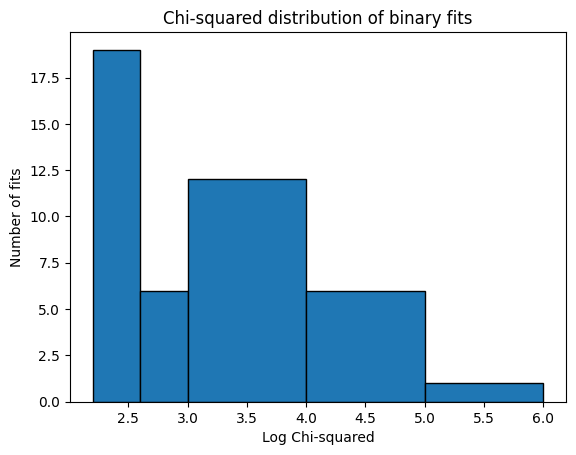

In [25]:
import numpy as np
chisq, cat = np.loadtxt('../Multiple_lc_run1_fits/Binaryfit_fail_chisq.txt', usecols =(3,4), unpack = True, dtype=str)
#Plot histogram of chi-squared values with a log axis
import matplotlib.pyplot as plt
bins = np.array([2.2,2.6,3.0,4.0,5.0,6.0])
chisqlog = np.log10(chisq.astype(float))
n,bins,patches = plt.hist(chisqlog, bins = bins, edgecolor = 'black', histtype = 'bar', density=False)
plt.xlabel('Log Chi-squared')
plt.ylabel('Number of fits')
plt.title('Chi-squared distribution of binary fits')
plt.show()


In [26]:
bins, n

(array([2.2, 2.6, 3. , 4. , 5. , 6. ]), array([19.,  6., 12.,  6.,  1.]))

In [29]:
np.count_nonzero(chisq.astype(float) < 300.)

16

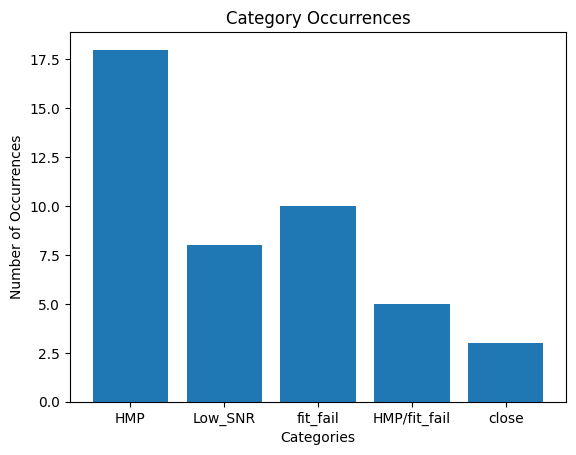

In [30]:
import matplotlib.pyplot as plt
from collections import Counter

category_counts = Counter(cat)
categories = list(category_counts.keys())
values = list(category_counts.values())

# Create bar plot
plt.bar(categories, values)

# Add title and labels
plt.title('Category Occurrences')
plt.xlabel('Categories')
plt.ylabel('Number of Occurrences')

# Show plot
plt.show()

In [31]:
categories, values

(['HMP', 'Low_SNR', 'fit_fail', 'HMP/fit_fail', 'close'], [18, 8, 10, 5, 3])

In [35]:
catcount = []
chicount = []
for i in range(len(cat)):
    if chisq[i].astype(float) <= 300.:
        catcount.append(cat[i])
    if cat[i] == 'HMP':
        chicount.append(chisq[i].astype(float))
        
print(chicount)



[162.1, 6021.7, 307.7, 6333.0, 800.9, 345.2, 700.5, 1657.8, 249.0, 171.0, 226.1, 588.0, 437.8, 163.6, 602.4, 248.6, 18141.7, 8195.5]


In [50]:
falpha, u0 = np.loadtxt('../Multiple_lc_run1_fits/Binaryfit_fail_chisq.txt', usecols =(0,1), unpack = True, dtype=float)
#create tuple pairs of alpha and u0
falphau0 = list(zip(falpha, u0))
#remove duplicates
falphau0 = list(set(falphau0))
falphau01 = falphau0[:len(falphau0)//2]
falphau02 = falphau0[len(falphau0)//2:]




[(150.0, 0.015), (60.0, 0.0), (120.0, -0.015), (60.0, -0.05), (150.0, 0.05), (30.0, -0.2), (150.0, 0.025), (60.0, -0.015), (150.0, 0.0), (150.0, -0.025), (0.0, -0.075), (150.0, -0.015), (0.0, 0.0), (0.0, -0.025), (90.0, 0.0), (90.0, -0.025), (30.0, 0.015), (30.0, -0.075)] [(150.0, -0.2), (60.0, 0.2), (90.0, -0.015), (90.0, -0.1), (120.0, 0.015), (30.0, 0.0), (120.0, -0.075), (0.0, -0.2), (60.0, 0.015), (60.0, 0.1), (0.0, -0.05), (120.0, 0.025), (90.0, -0.2), (60.0, -0.075), (120.0, 0.0), (60.0, 0.025), (120.0, -0.025), (120.0, -0.05), (150.0, 0.015), (60.0, 0.0), (120.0, -0.015), (60.0, -0.05), (150.0, 0.05), (30.0, -0.2), (150.0, 0.025), (60.0, -0.015), (150.0, 0.0), (150.0, -0.025), (0.0, -0.075), (150.0, -0.015), (0.0, 0.0), (0.0, -0.025), (90.0, 0.0), (90.0, -0.025), (30.0, 0.015), (30.0, -0.075)]


Extract fit chisq's from CB data files

In [4]:
import numpy as np
import os
falphal = np.linspace(0,180,10,endpoint=False)
fu0l = np.linspace(-0.3, 0.3, 61)
binaryfitfail = []
notcb = []
for falpha in falphal:
    folder_path = '../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha%.1f'%(falpha)
    alpha = 360 - falpha
    for fu0 in fu0l:
        file_path = folder_path + '/u%.3falpha%d.txt'%(fu0, alpha)
        if os.path.isfile(file_path):
            print(file_path)
        else:
            print('No file')
            continue
        deltachisq, flag = np.loadtxt(file_path, usecols=(9,10), unpack=True, dtype=str, comments='#')
        deltachisq = deltachisq.astype(float)
        if len(deltachisq) == 2:
             finalpspl = deltachisq[np.where(flag == 'Final-PSPL')][0]
             notcb.append([str(falpha), str(np.round(fu0, 2)), 'PSPL', str(finalpspl), '0.0', '0.0'])
        else:
            finalpp = deltachisq[np.where(flag == 'Final-Planet-Planet')][0]
            finalbb = deltachisq[np.where(flag == 'Final-Binary-Binary')][0]
            finalpspl = deltachisq[np.where(flag == 'Final-PSPL')][0]
            finalp = deltachisq[np.where(flag == 'Final-Planet')][0]
            finalb = deltachisq[np.where(flag == 'Final-Binary')][0]
            initialp = deltachisq[np.where(flag == 'Initial-Planet')][0]
            initialb = deltachisq[np.where(flag == 'Initial-Binary')][0]
            if np.abs(finalpp) > 160.:
                binaryfitfail.append([str(falpha), str(np.round(fu0,2)), 'Planet failed', str(finalpp)])
            if np.abs(finalbb) > 160.:
                binaryfitfail.append([str(falpha), str(np.round(fu0, 2)), 'Binary failed', str(finalbb)])
            if np.abs(finalpspl) < 160.:
                notcb.append([str(falpha), str(np.round(fu0, 2)), 'PSPL', str(finalpspl), '0.0', '0.0'])
            if np.abs(finalp) < 160. and np.abs(finalpspl) > 160.:
                notcb.append([str(falpha), str(np.round(fu0, 2)), 'Planet', str(finalp), str(initialp), str(initialb)])
            if np.abs(finalb) < 160. and np.abs(finalpspl) > 160.:
                notcb.append([str(falpha), str(np.round(fu0, 2)), 'Binary', str(finalb), str(initialp), str(initialb)])
        
np.savetxt('../../Multiple_lc_run2-Me_fits/Binaryfit_fail_chisq.txt', binaryfitfail, fmt='%s')
np.savetxt('../../Multiple_lc_run2-Me_fits/notcb_chisq.txt', notcb, fmt='%s')
        

../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha0.0/u-0.300alpha360.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha0.0/u-0.290alpha360.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha0.0/u-0.280alpha360.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha0.0/u-0.270alpha360.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha0.0/u-0.260alpha360.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha0.0/u-0.250alpha360.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha0.0/u-0.240alpha360.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha0.0/u-0.230alpha360.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha0.0/u-0.220alpha360.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha0.0/u-0.210alpha360.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha0.0/u-0.200alpha360.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha0.0/u-0.190alpha360.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha0.0/u-0.180alpha360.txt

../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha36.0/u-0.010alpha324.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha36.0/u0.000alpha324.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha36.0/u0.010alpha324.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha36.0/u0.020alpha324.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha36.0/u0.030alpha324.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha36.0/u0.040alpha324.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha36.0/u0.050alpha324.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha36.0/u0.060alpha324.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha36.0/u0.070alpha324.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha36.0/u0.080alpha324.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha36.0/u0.090alpha324.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha36.0/u0.100alpha324.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha36.0/u0.110alpha324.tx

../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha72.0/u0.270alpha288.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha72.0/u0.280alpha288.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha72.0/u0.290alpha288.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha72.0/u0.300alpha288.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha90.0/u-0.300alpha270.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha90.0/u-0.290alpha270.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha90.0/u-0.280alpha270.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha90.0/u-0.270alpha270.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha90.0/u-0.260alpha270.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha90.0/u-0.250alpha270.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha90.0/u-0.240alpha270.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha90.0/u-0.230alpha270.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha90.0/u-0.220alp

../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha126.0/u-0.080alpha234.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha126.0/u-0.070alpha234.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha126.0/u-0.060alpha234.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha126.0/u-0.050alpha234.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha126.0/u-0.040alpha234.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha126.0/u-0.030alpha234.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha126.0/u-0.020alpha234.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha126.0/u-0.010alpha234.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha126.0/u0.000alpha234.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha126.0/u0.010alpha234.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha126.0/u0.020alpha234.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha126.0/u0.030alpha234.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha126

../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha162.0/u0.190alpha198.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha162.0/u0.200alpha198.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha162.0/u0.210alpha198.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha162.0/u0.220alpha198.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha162.0/u0.230alpha198.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha162.0/u0.240alpha198.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha162.0/u0.250alpha198.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha162.0/u0.260alpha198.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha162.0/u0.270alpha198.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha162.0/u0.280alpha198.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha162.0/u0.290alpha198.txt
../../Multiple_lc_run2-Me_fits/s20p2s30p9psi60.0alpha162.0/u0.300alpha198.txt


In [60]:
import numpy as np
notcb = np.loadtxt('../Multiple_lc_run2-Me_fits/notcb_chisq.txt', dtype=str)
#if file exists
failed_params = []
if os.path.isfile('../Multiple_lc_run2-Me_fits/Binaryfit_fail_chisq.txt'):
    binaryfitfail = np.loadtxt('../Multiple_lc_run2-Me_fits/Binaryfit_fail_chisq.txt', dtype=str)
    falphaff, fu0ff = binaryfitfail[:,0].astype(float), binaryfitfail[:,1].astype(float)
    failed_params = list(zip(falphaff, fu0ff))
countb = 0
count = 0
falpha = []
fu0 = []
falphap = []
fu0p = []
falphau0planet = []
falphau0binary = []
notcbcoord = list(zip(notcb[:,0].astype(float), notcb[:,1].astype(float)))
notcbcoord = list(set(notcbcoord))
for system in notcb:
    if system[2] == 'Planet' or system[2] == 'Binary':
        countb += 1

        falpha.append(float(system[0])*np.pi/180.)
        fu0.append(float(system[1]))
    if system[2] == 'PSPL':
        falphap.append(float(system[0])*np.pi/180.)
        fu0p.append(float(system[1]))
        count += 1
    if system[2] == 'Planet':
        falphau0planet.append([float(system[0])*np.pi/180.,float(system[1])])
    if system[2] == 'Binary':
        falphau0binary.append([float(system[0])*np.pi/180.,float(system[1])])
countb, count

(341, 323)

In [61]:
len(notcbcoord)

593

In [63]:
#Total length 
falphal = np.linspace(0,180,10,endpoint=False)
fu0l = np.linspace(-0.3, 0.3, 61)
len(falphal)*len(fu0l) 

610

DON'T DOUBLE REMOVE!

In [54]:
planettraj = 0
binarytraj = 0
for falphau0 in falphau0binary:
    if falphau0 not in falphau0planet:
        binarytraj+=1
for falphau0 in falphau0planet:
    if falphau0 not in falphau0binary:
        planettraj+=1
print(len(falphau0planet), planettraj, len(falphau0planet) - planettraj, len(falphau0binary), binarytraj, len(falphau0binary) - binarytraj)

40 0 40 259 219 40


Total number of planet caustic crossing trajectories = 76
Number detected = 2
Percent detected = 2.6%
Total number of binary caustic crossing trajectories (may also cross planet) = 104 + 38 = 142
Number detected = 73
Percent Detected = 51.4%
Total detection efficiency=34.40%

In [68]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import gridspec
import TripleLensing
TRIL = TripleLensing.TripleLensing()
import MulensModel as mm
import numpy as np
import seaborn as sns
import os
from time import time
import VBMicrolensing 

VBM = VBMicrolensing.VBMicrolensing()
VBM.Tol = 1e-4
VBM.SetMethod(VBM.Method.Multipoly)

#meausre the time taken to run this function
start = time()
t0, tE, s2, q2, s3, q3, psi, rs = 2000., 30., 0.2, 0.925, 0.9, 1.0*1e-5, np.pi/3., 0.001
#s3 = 0.1*np.cos(psi) + np.sqrt(0.01*(np.cos(psi)**2 - 1) + s3plan**2)
#q3 = 2.*q3plan
#params = [t0, u0, tE, s2, q2, alpha, s3, q3, psi, rs]
psideg = psi*180./np.pi
#set up lens system
m1 = 1./(1. + q2+ q3)
m2 = q2 * m1
m3 = q3 * m1
z1x = -q2*s2/(1. + q2)
z2x = s2/(1. + q2)
z3x = -q2*s2/(1. + q2) + s3*np.cos(psi)
z3y = s3*np.sin(psi)
mlens = [m1, m2, m3]
zlens = [z1x,0.,z2x,0.,z3x,z3y]
number = "1"
gamma = (75./2.)/tE

parameters = [z1x,0,m1, # First lens: x1_1, x1_2, m1
              z2x,0,m2,     # Second lens: x2_1, x2_2, m2
              z3x,z3y,m3    # Third lens: x3_1, x3_2, m3
                        ]   # Fourth lens: x4_1, x4_2, m4

VBM.SetLensGeometry(parameters)

#planet orientation (planet at planet position, star at origin)
splanet = np.sqrt(z3x**2 + z3y**2)
qplanet = m3/(m1+m2)
alphamulens = (2.0*np.pi - alpha)*180./np.pi
planetcom = np.array([(m3*z3x)/(m1+m2+m3),(m3*z3y)/(m1+m2+m3)]) #Position of COM of planet and star
planetcomdist = np.sqrt(planetcom[0]**2 + planetcom[1]**2)
print(s3, q3)
if z3y > 0:
    planetorient = np.arctan2(z3y,z3x)
elif z3y == 0:
    if z3x > 0:
        planetorient = 0.
    elif z3x < 0:
        planetorient = np.pi
else:
    planetorient = 2*np.pi + np.arctan2(z3y,z3x)
print(splanet, qplanet)



    


0.9 1e-05
0.856003768889391 5.194805194805194e-06


(126.0, 0.000) failed
(126.0, 0.060) failed
(144.0, -0.010) failed
(144.0, 0.150) failed
(162.0, 0.230) failed


Text(0.5, 1.0, 's2 = 0.200, q2 = 0.925, s3 = 0.900, q3 = 0.000, psi = 60.000, rs = 0.001')

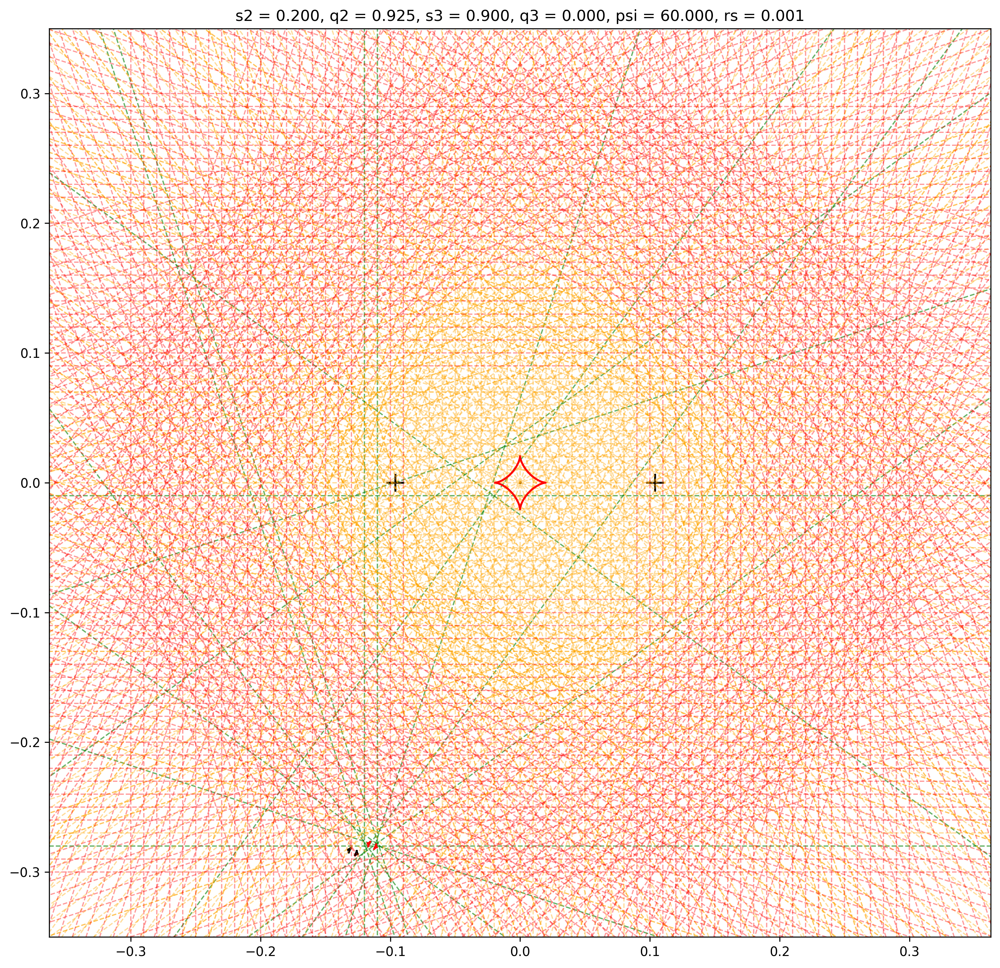

In [69]:
import matplotlib.lines as mlines
countcb = 0
countnotcb = 0
#s=1.50 q=1e-3 psi = 135
falphat = np.linspace(0.,180.,10,endpoint=False)
fu0t = np.linspace(-0.3, 0.3, 61)
fu0t = np.round(fu0t,2)
"""
if q3plan == 1e-3:
    fu0t = np.linspace(-0.4, 0.4, int((0.8)/0.02+1), endpoint=True)
else:
    fu0t = np.linspace(-0.3, 0.3, int((0.6)/0.01+1), endpoint=True)
"""
allcoord = []
cbcoord = []


# Caustics for triple lens
caustics = VBM.Multicaustics()
f = plt.figure(figsize=(12,12),dpi=300)
gs = gridspec.GridSpec(1,1)
ax = plt.subplot(gs[0])
plt.subplots_adjust(top = 0.9, bottom = 0.08, right = 0.95, left = 0.1, hspace = 0.1, wspace = 0.2)



# plot lens position
for i in range(3): #3
        ax.scatter(zlens[i*2], zlens[i*2+1], marker = "+",s = 200, color = "k")

for cau in caustics:
    plt.plot(cau[0], cau[1], color = 'r', label = "CB")
plt.axis("equal")

planet_caustic = mm.Caustics(s=splanet, q=qplanet)
planetx, planety = planet_caustic.get_caustics()
planetx = np.array(planetx)
planety = np.array(planety)
planetxr = planetx*np.cos(planetorient) - planety*np.sin(planetorient)
planetyr = planetx*np.sin(planetorient) + planety*np.cos(planetorient)
ax.scatter(planetxr,planetyr, marker='.', s= 1,color='black', label = "Planet caustics", alpha=0.3)


for i in range(len(falpha)):
    alpha = falpha[i]
    u0 = fu0[i]
    salpha = np.sin(alpha)
    calpha = np.cos(alpha)
    ts = np.linspace(t0 - gamma*tE, t0 + gamma*tE, int(2.*gamma*tE*1440./15.))
    tsdash = np.linspace(t0 - 5.*tE, t0 + 5.*tE, 10000)
    tn = (ts - t0) / tE
    tndash = (tsdash - t0) / tE
    y1s = u0 * salpha + tn * calpha # source positions
    y2s = u0 * calpha - tn * salpha
    y1straj = u0 * salpha + tndash * calpha #source positions for source trajectory
    y2straj = u0 * calpha - tndash * salpha
    #plot a line to show source trajectory
    ax.plot(y1straj,y2straj,color = "orange", linestyle = "--", linewidth = 0.95, zorder=1, alpha=0.4)

for i in range(len(falphap)):
    alpha = falphap[i]
    u0 = fu0p[i]
    salpha = np.sin(alpha)
    calpha = np.cos(alpha)
    ts = np.linspace(t0 - gamma*tE, t0 + gamma*tE, int(2.*gamma*tE*1440./15.))
    tsdash = np.linspace(t0 - 5.*tE, t0 + 5.*tE, 10000)
    tn = (ts - t0) / tE
    tndash = (tsdash - t0) / tE
    y1s = u0 * salpha + tn * calpha # source positions
    y2s = u0 * calpha - tn * salpha
    y1straj = u0 * salpha + tndash * calpha #source positions for source trajectory
    y2straj = u0 * calpha - tndash * salpha
    #plot a line to show source trajectory
    ax.plot(y1straj,y2straj,color = "red", linestyle = "--", alpha=0.4, linewidth = 0.95, zorder=1)
countf = 0
#if the file exists
outliers = []
if os.path.isfile('../Multiple_lc_run2-Me_fits/outliers.txt'):
    outliers_alpha, outliers_u0 = np.loadtxt('../Multiple_lc_run2-Me_fits/outliers.txt', dtype=float, usecols=(0,1), unpack=True)
    outliers = [(outliers_alpha, outliers_u0)]
    #if len(outliers_alpha) > 0:
        #outliers = list(zip(outliers_alpha, outliers_u0))

for i in range(len(falphat)):
    for j in range(len(fu0t)):
        coord = (falphat[i], fu0t[j])
        allcoord.append(coord)
        if len(failed_params) > 0:
            if coord in failed_params:
                print("(%.1f, %.3f) failed"%(falphat[i], fu0t[j]))
                countf += 1
                continue
        if coord in notcbcoord:
            countnotcb += 1
            continue
        if len(outliers) > 0:
            if coord in outliers:
                print(coord)
                continue
        
        alpha = falphat[i]*np.pi/180.
        u0 = fu0t[j]
        salpha = np.sin(alpha)
        calpha = np.cos(alpha)
        ts = np.linspace(t0 - gamma*tE, t0 + gamma*tE, int(2.*gamma*tE*1440./15.))
        tsdash = np.linspace(t0 - 5.*tE, t0 + 5.*tE, 10000)
        tn = (ts - t0) / tE
        tndash = (tsdash - t0) / tE
        y1s = u0 * salpha + tn * calpha # source positions
        y2s = u0 * calpha - tn * salpha
        y1straj = u0 * salpha + tndash * calpha #source positions for source trajectory
        y2straj = u0 * calpha - tndash * salpha
        #plot a line to show source trajectory
        ax.plot(y1s,y2s,color = "green", linestyle = "--", linewidth = 1, zorder=0, alpha = 0.6)
        countcb += 1
        cbcoord.append(coord)


#green_line = mlines.Line2D([], [], color='green', linestyle='--', label='CB detected')
#orange_line = mlines.Line2D([], [], color='orange', linestyle='--', label='Binary star/planet detected')
#red_line = mlines.Line2D([], [], color='red', linestyle='--', label='PSPL detected')
#handles2 = [green_line, orange_line, red_line]
#labels2 = [h.get_label() for h in handles2]
#legend1 = ax.legend(handles2, labels2, loc='best')
#x.add_artist(legend1)







plt.xlim(-0.35,0.35)
plt.ylim(-0.35,0.35)

plt.title("s2 = %.3f, q2 = %.3f, s3 = %.3f, q3 = %.3f, psi = %.3f, rs = %.3f"%(s2,q2,s3,q3,psideg,rs))
#plt.savefig('./Multiple_lc_run1/%s/u%.3falpha%d_caustic.png'%(folder,u0,alphamulens))

In [25]:
np.savetxt('../Planet_grid_run_files/s1.50q1.0e-03psi135.0/cbcoord.txt', cbcoord, fmt='%s')

In [71]:
cbcoord

[(0.0, -0.28),
 (0.0, -0.01),
 (18.0, -0.3),
 (36.0, -0.29),
 (36.0, -0.02),
 (54.0, -0.26),
 (72.0, -0.2),
 (72.0, -0.19),
 (90.0, -0.12),
 (90.0, -0.11),
 (108.0, -0.02),
 (126.0, -0.01),
 (126.0, 0.07),
 (144.0, -0.03),
 (144.0, 0.16),
 (162.0, -0.03)]

Assignments

In [3]:
import numpy as np
import astropy.units as u
import astropy.constants as const

In [15]:


t_crab = (970*u.yr).to(u.s)
E_break = 0.1*u.eV
E_break = E_break.to(u.erg) 
B = (1.5*8*np.pi*const.m_e.cgs*const.c.cgs*const.e.esu*const.h.cgs/(const.sigma_T.cgs**2*t_crab**2*E_break))**(1./3.)
B

<Quantity 0.00036672 Fr(1/3) g(1/3) / (s(2/3) cm)>

In [17]:
gamma = 4.*np.pi*const.m_e.cgs*const.c.cgs/(const.sigma_T.cgs*B**2*t_crab)
gamma

<Quantity 125312.336107 cm g(1/3) / (Fr(2/3) s(2/3))>

In [103]:
import sys
sys.path.append('/Users/murlidhar.4/Documents/Projects/microlens/triplelens-1.0.7/test/')
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import gridspec
import MulensModel as mm
import matplotlib.lines as mlines
import numpy as np
import os
from time import time
import VBMicrolensing

VBM = VBMicrolensing.VBMicrolensing()
VBMp = VBMicrolensing.VBMicrolensing()
VBMp.Tol = 1e-5
VBMp.SetMethod(VBMp.Method.Multipoly)
VBM.Tol = 1e-5
VBM.SetMethod(VBM.Method.Multipoly)

def magtoflux(mag, zeropint = 27.615):
    return 10.**(-0.4*(mag - zeropint))

def gencblc(params, folder):
    # meausre the time taken to run this function
    start = time()
    t0, u0, tE, s2, q2, alpha, s3, q3, psi, rs = params
    salpha = np.sin(alpha)
    calpha = np.cos(alpha)
    params = [t0, u0, tE, s2, q2, alpha, s3, q3, psi, rs]
    psideg = psi*180./np.pi
    # set up lens system
    m1 = 1./(1. + q2+ q3)
    m2 = q2 * m1
    m3 = q3 * m1
    z1x = -q2*s2/(1. + q2)
    z2x = s2/(1. + q2)
    z3x = -q2*s2/(1. + q2) + s3*np.cos(psi)
    z3y = s3*np.sin(psi)
    mlens = [m1, m2, m3]
    zlens = [z1x,0.,z2x,0.,z3x,z3y]
    number = "1"
    gamma = (75./2.)/tE
    # source position
    ts = np.linspace(t0 - gamma*tE, t0 + gamma*tE, int(2.*gamma*tE*1440./15.))
    tsdash = np.linspace(t0 - 5.*tE, t0 + 5.*tE, 10000)
    tn = (ts - t0) / tE  # tau
    tndash = (tsdash - t0) / tE
    y1s = u0 * salpha + tn * calpha  # source positions
    y2s = u0 * calpha - tn * salpha
    y1straj = u0 * salpha + tndash * calpha  # source positions for source trajectory
    y2straj = u0 * calpha - tndash * salpha

    #Initialize the lens system - VB microlensing
    parameters = [z1x,0,m1, # First lens: x1_1, x1_2, m1
              z2x,0,m2,     # Second lens: x2_1, x2_2, m2
              z3x,z3y,m3    # Third lens: x3_1, x3_2, m3
                        ]   # Fourth lens: x4_1, x4_2, m4

    VBM.SetLensGeometry(parameters) #Initialize the lens configuration

    # planet orientation (planet at planet position, star at origin)
    splanet = np.sqrt(z3x**2 + z3y**2)
    qplanet = m3/(m1+m2)
    alphamulens = (2.0*np.pi - alpha)*180./np.pi
    planetcom = np.array([(m3*z3x)/(m1+m2+m3),(m3*z3y)/(m1+m2+m3)])  # Position of COM of planet and star
    planetcomdist = np.sqrt(planetcom[0]**2 + planetcom[1]**2)
    u0planet = np.abs(planetcom[0]*salpha + planetcom[1]*calpha - u0)*np.sign(u0)  # impact parameter of planet
    slopep = z3y/z3x
    slopet = -np.tan(alpha)
    beta = np.arctan(np.abs((slopep - slopet)/(1. + slopep*slopet)))
    #print(round(np.abs(u0planet - u0),6),round(planetcomdist*np.sin(beta),6))

    if z3y > 0:
        planetorient = np.arctan2(z3y,z3x)
    elif z3y == 0:
        if z3x > 0:
            planetorient = 0.
        elif z3x < 0:
            planetorient = np.pi
    else:
        planetorient = 2*np.pi + np.arctan2(z3y,z3x)
    alphaplanet = alphamulens - planetorient*180./np.pi

    planet_parameters = [0., 0., (m1+m2),
                        z3x, z3y, m3]
    VBMp.SetLensGeometry(planet_parameters)
    #y1splanet = u0planet * np.sin((360. - alphaplanet)*np.pi/180.) + tn * np.cos((360. - alphaplanet)*np.pi/180.)
    #y2splanet = u0planet * np.cos((360. - alphaplanet)*np.pi/180.) - tn * np.sin((360. - alphaplanet)*np.pi/180.)
    

    print("splanet = %.4f, qplanet = %.5f, planetcomdist = %.5f, u0planet = %.5f, alphamulens = %.1f, planetorient = %.2f, alphaplanet = %.2f"%(splanet, qplanet, planetcomdist, u0planet, alphamulens, planetorient*180./np.pi, alphaplanet))

    #binary without planet and planetary system with star at COM of binary
    binary = mm.Model( {'t_0': t0, 'u_0': u0, 't_E': tE, 's': s2, 'q': q2, 'alpha': alphamulens,
        'rho': rs})
    binary_caustic = mm.Caustics(q = q2, s = s2)
    #planet_caustic = mm.Caustics(q = qplanet, s = splanet)
    binary.set_magnification_methods([t0 - gamma*tE, 'VBBL', t0 + gamma*tE])
    planet = mm.Model( {'t_0': t0, 'u_0': u0planet, 't_E': tE, 's': splanet, 'q': qplanet, 'alpha': alphaplanet,
        'rho': rs})
    planet.set_magnification_methods([t0 - gamma*tE, 'VBBL', t0 + gamma*tE])
    pspl = mm.Model({'t_0': t0, 'u_0': u0, 't_E': tE})



    # Caustics for triple lens
    caustics = VBM.Multicaustics()
    causticsp = VBMp.Multicaustics()
    f = plt.figure(figsize=(12,12),dpi=300)
    gs = gridspec.GridSpec(1,1)
    ax = plt.subplot(gs[0])
    plt.subplots_adjust(top = 0.9, bottom = 0.08, right = 0.95, left = 0.1, hspace = 0.1, wspace = 0.2)

    # plot lens position

    for i in range(3): #3
        ax.scatter(zlens[i*2], zlens[i*2+1], marker = "+",s = 200, color = "k")

    for cau in caustics:
        plt.plot(cau[0], cau[1], color = 'r', label = "CB")
    for cau in causticsp:
        plt.plot(cau[0], cau[1], color = 'g', label = "Planet")
    plt.axis("equal")
    plt.grid(True)
    #plot a line to show source trajectory
    ax.plot(y1straj,y2straj,color = "k", linestyle = "--", label = "Source trajectory")
    plt.xlim(-0.35,0.35)
    plt.ylim(-0.35,0.35)
    plt.legend(loc = "best")
    plt.title("s2 = %.3f, q2 = %.3f, s3 = %.3f, q3 = %.3f, psi = %.3f, rs = %.3f"%(s2,q2,s3,q3,psideg,rs))
    plt.savefig('../Multiple_lc_run2-Me/%s/u%.3falpha%d_caustic.png'%(folder,u0,alphamulens))
    plt.close()

    """
    causticsp = VBMp.Multicaustics()
    f = plt.figure(figsize=(12,12),dpi=300)
    gs = gridspec.GridSpec(1,1)
    ax = plt.subplot(gs[0])
    plt.subplots_adjust(top = 0.9, bottom = 0.08, right = 0.95, left = 0.1, hspace = 0.1, wspace = 0.2)

    # plot lens position

  
    ax.scatter(0.0,0.0, marker = "+",s = 200, color = "k")
    ax.scatter(splanet+0.005,0., marker = "+",s = 200, color = "k")

    for cau in causticsp:
        plt.plot(cau[0], cau[1], color = 'r', label = "CB")
    plt.axis("equal")
    plt.grid(True)
    #plot a line to show source trajectory
    ax.plot(y1splanet,y2splanet,color = "k", linestyle = "--", label = "Source trajectory")
    plt.xlim(-0.35,0.35)
    plt.ylim(-0.35,0.35)
    plt.legend(loc = "best")
    plt.title("s2 = %.3f, q2 = %.3f, s3 = %.3f, q3 = %.3f, psi = %.3f, rs = %.3f"%(s2,q2,s3,q3,psideg,rs))
    #plt.savefig('../Multiple_lc_run2-Me/%s/u%.3falpha%d_caustic.png'%(folder,u0,alphamulens))
    plt.show()
    plt.close()
    """

   
    vbmag = []
    vbplanetmag = []
    for i in range(len(y1s)):
        vbmag.append(VBM.MultiMag(y1s[i],y2s[i],rs))
    vbmag = np.array(vbmag)
    for i in range(len(y1s)):
        vbplanetmag.append(VBMp.MultiMag(y1s[i],y2s[i],rs))
    vbplanetmag = np.array(vbplanetmag)

    #mus = TRIL.TriLightCurve(mlens, zlens, y1s, y2s, rs, secnum, basenum, quaderr_Tol, relerr_Tol)
    photapert = 9
    exp_time = 50
    sourcemag = 20.0
    blendmag = 27.615
    sourceflux = magtoflux(sourcemag)
    blendflux = magtoflux(blendmag)
    rdnoise = 12.12*photapert
    darkcurr = 1.072*exp_time*photapert
    sky = 3.43*exp_time*photapert
    cbflux = sourceflux*np.array(vbmag) + blendflux
    #lcfluxerror = np.random.normal(cbflux, np.sqrt(cbflux + darkcurr + sky + rdnoise**2), len(cbflux))
    lcerrorbar = np.sqrt(cbflux + darkcurr + sky + rdnoise**2)
    planetlc = sourceflux*np.array(vbplanetmag) + blendflux
    #planetlcerr = np.random.normal(planetlc, np.sqrt(planetlc + darkcurr + sky + rdnoise**2), len(planetlc))
    planeterrorbar = np.sqrt(planetlc + darkcurr + sky + rdnoise**2)
    binarymag = binary.get_magnification(ts)
    binarylc = sourceflux*np.array(binarymag) + blendflux
    #binarylcerr = np.random.normal(binarylc, np.sqrt(binarylc + darkcurr + sky + rdnoise**2), len(binarylc))
    binlcerrorbar = np.sqrt(binarylc + darkcurr + sky + rdnoise**2)
    psplmag = pspl.get_magnification(ts)
    pspllc = sourceflux*np.array(psplmag) + blendflux

    diffmagcbb = (cbflux - binarylc)/binarylc #lcfluxerror REPLACED
    diffmagcbp = (cbflux - planetlc)/planetlc
    diffmagcbpspl = (cbflux - pspllc)/pspllc

    np.savetxt('../Multiple_lc_run2-Me/%s/u%.3falpha%d_flux.txt'%(folder,u0,alphamulens), np.array([ts,cbflux,lcerrorbar]).T)
    np.savetxt('../Multiple_lc_run2-Me/%s/u%.3falpha%d_info.txt'%(folder,u0,alphamulens), np.array([t0,u0,tE,s2,q2,alphamulens,rs,s3,q3,psideg]), header='t0, u0, tE, s2, q2, alpha, rs, s3, q3, psi')

    np.savetxt('../Multiple_lc_run2-Me/%s/u%.3falpha%d_planetflux.txt'%(folder,u0,alphamulens), np.array([ts,planetlc,planeterrorbar]).T)
    np.savetxt('../Multiple_lc_run2-Me/%s/u%.3falpha%d_planetinfo.txt'%(folder,u0,alphamulens), np.array([t0,u0planet,tE,splanet,qplanet,alphaplanet,rs]), header='t0, u0, tE, s, q, alpha, rs')

    np.savetxt('../Multiple_lc_run2-Me/%s/u%.3falpha%d_binflux.txt'%(folder,u0,alphamulens), np.array([ts,binarylc,binlcerrorbar]).T)
    np.savetxt('../Multiple_lc_run2-Me/%s/u%.3falpha%d_bininfo.txt'%(folder,u0,alphamulens), np.array([t0,u0,tE,s2,q2,alphamulens,rs]), header='t0, u0, tE, s2, q2, alpha, rs')

    #Plot the CB light curve with binary, planet and pspl models
    fig, ax = plt.subplots(figsize = (15,10), dpi = 200)
    ax.errorbar(ts, np.log10(cbflux), yerr = lcerrorbar/(cbflux*np.log(10)), fmt= '.', color='darkorange', markersize=0.5, label = r'Data : $t_0$=%.1f,$u_0$=%.3f,$t_E$=%.1f,$s_2$=%0.2f,$q_2$=%0.3f,$\alpha$=%0.1f,$\rho$=%0.3f, $s_3$ = %0.2f, $q_3$ = %0.3f, $\psi$=%0.1f'%(t0, u0, tE, s2, q2, alphamulens, rs, s3, q3, psideg))
    ax.plot(ts, np.log10(pspllc), linestyle = ':', color = 'black', markersize=0.8, label= r'PSPL Model: $t_0$=%.1f,$u_0$=%.3f,$t_E$=%.1f,$\rho$=%0.3f'%(t0, u0, tE, rs))
    ax.plot(ts,np.log10(binarylc), linestyle = '-', color = 'blue', markersize=0.8, label= r'Binary Model: $t_0$=%.1f,$u_0$=%.3f,$t_E$=%.1f,$\rho$=%0.3f,s=%0.2f,q=%0.3f,$\alpha$=%0.1f'%(t0, u0, tE, rs, s2, q2, alphamulens))
    ax.plot(ts, np.log10(planetlc), color='red', linestyle='--', markersize=0.8, label= r'Planet Model: $t_0$=%.1f,$u_0$=%.3f,$t_E$=%.1f,$\rho$=%0.3f,s=%0.2f,q=%0.3f,$\alpha$=%0.1f'%(t0, u0planet,tE, rs, splanet, qplanet, alphaplanet))
    
    
    ax.set_xlabel("Time")
    ax.set_ylabel("Log(Flux)")
    ax.set_title("Data with binary, planetary, and PSPL light curves")
    handles, labels = ax.get_legend_handles_labels()
    legend1 = ax.legend(handles, labels, loc='lower center')
    ax.add_artist(legend1)

    residualpspl = np.abs(cbflux - pspllc)/cbflux
    tsmaxdev = ts[np.argmax(residualpspl)]

    #inset axes
    if np.max(residualpspl) < 0.1:
        x1, x2, y1, y2 = 2000. - 3, 2000. + 3, np.log10(np.max(cbflux)) - 0.5, np.log10(np.max(cbflux)) + 0.5  # subregion of the original image
    else:    
        x1, x2, y1, y2 = tsmaxdev - 3, tsmaxdev + 3, np.log10(cbflux[np.argmax(residualpspl)]) - 0.5, np.log10(cbflux[np.argmax(residualpspl)]) + 0.5  # subregion of the original image
    axins = ax.inset_axes(
        [0.64,0.64,0.35,0.33],
        xlim=(x1, x2), ylim=(y1, y2), xticks=[])
    axins2 = ax.inset_axes(
        [0.64,0.48,0.35,0.14],
        xlim=(x1, x2))
    axins.errorbar(ts, np.log10(cbflux), yerr=lcerrorbar/(cbflux*np.log(10)), fmt= '.', color='darkorange', markersize=0.5)

    axins.plot(ts, np.log10(pspllc), color='black', linestyle=':', markersize=0.5)
    residualsplan = (cbflux - planetlc)/cbflux
    axins.plot(ts, np.log10(planetlc), color='red', linestyle='--', markersize=0.5)
    axins2.scatter(ts, residualsplan , color='red', s=0.5, label='Planet')
    residualsbin = (cbflux - binarylc)/cbflux
    axins.plot(ts, np.log10(binarylc), color='blue', linestyle='-', markersize=0.5)
    axins2.scatter(ts, residualsbin, color='blue', s=0.5, label='Binary')
    
    handles, labels = axins2.get_legend_handles_labels()
    legend1 = axins2.legend(handles, labels, loc='best')
    axins2.add_artist(legend1)
    axins2.set_xlabel('HJD')
    axins2.set_ylabel('Residuals')
    plt.subplots_adjust(hspace=0.1)
    #main, gs = pltlkv(ts, mus, params, label = "Without limb-darkening")
    plt.savefig('../Multiple_lc_run2-Me/%s/u%.3falpha%d_lc.png'%(folder,u0,alphamulens))
    plt.close()
    end = time()
    print("Time taken = %.2f"%(end - start))


In [104]:
rs = 0.001

#event parameters
t0 = 2000.
u0 = [-0.26] #-0.58
tE = 30.
s2 = 0.20
q2 = 0.925
alpha = [54.*np.pi/180.] #//rad
s3 = 0.90
q3 = 0.00001
psi = np.pi/3.0 #//rad
rs = 0.001

for alphar in alpha:
    folder = "Test"
    path = '../Multiple_lc_run2-Me/%s/'%(folder)
    if not os.path.exists(path):
        os.makedirs(path)
    for u in u0:
        params = [t0, u, tE, s2, q2, alphar, s3, q3, psi, rs]
        gencblc(params, folder)


splanet = 0.8560, qplanet = 0.00001, planetcomdist = 0.00000, u0planet = -0.26000, alphamulens = 306.0, planetorient = 65.58, alphaplanet = 240.42
Time taken = 6.09
